In [3]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 61.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 51.5 MB/s eta 0:00:00


In [5]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
import requests
from bs4 import BeautifulSoup
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [6]:
import_bert_tokenizer = AutoTokenizer.from_pretrained('nlptown/bert-base-multilingual-uncased-sentiment')

In [7]:
bert_model = AutoModelForSequenceClassification.from_pretrained('nlptown/bert-base-multilingual-uncased-sentiment')

## Collecting the reviews using Beautiful soup form yelp website of 14 pages reviews

In [103]:
reviews = ""
i = 10
while i <= 140:
  page_reviews = requests.get(f'https://www.yelp.com/biz/social-brew-cafe-pyrmont?start={i}')
  reviews += page_reviews.text
  i+=10

In [104]:
reviews

'<!DOCTYPE html><html lang="en-US" prefix="og: http://ogp.me/ns#" style="margin: 0;padding: 0; border: 0; font-size: 100%; font: inherit; vertical-align: baseline;"><head><script>document.documentElement.className=document.documentElement.className.replace(/\x08no-js\x08/,"js");</script><meta http-equiv="Content-Type" content="text/html; charset=UTF-8" /><meta http-equiv="Content-Language" content="en-US" /><meta name="viewport" content="width=device-width, initial-scale=1, shrink-to-fit=no"><link rel="mask-icon" sizes="any" href="https://s3-media0.fl.yelpcdn.com/assets/srv0/yelp_large_assets/b2bb2fb0ec9c/assets/img/logos/yelp_burst.svg" content="#FF1A1A"><link rel="shortcut icon" href="https://s3-media0.fl.yelpcdn.com/assets/srv0/yelp_large_assets/dcfe403147fc/assets/img/logos/favicon.ico"><script> window.ga=window.ga||function(){(ga.q=ga.q||[]).push(arguments)};ga.l=+new Date;window.ygaPageStartTime=new Date().getTime();</script><script>\n            window.yelp = window.yelp || {};\

In [105]:
len(reviews)

13623233

In [107]:
soup = BeautifulSoup(reviews, 'html.parser')
regex = re.compile('.*comment.*')
results = soup.find_all('p', {'class':regex})
customer_reviews = [result.text for result in results]

In [108]:
customer_reviews[0]

"It was ok. The coffee wasn't the best but it was fine. The relish on the breakfast roll was yum which did make it sing. So perhaps I just got a bad coffee but the food was good on my visit."

In [115]:
store_review = customer_reviews[1]
store_review_score = sentiment_analysis(reviews_data['reviews'].iloc[1])
print(f"{store_review} --> the sentiment score is --> {store_review_score}")

if store_review_score >= 4:
  print('POSITIVE REVIEW')
elif store_review_score == 3:
  print("NEUTRAL REVIEW")
else :
  print("NEGATIVE REVIEW")

This place is a gem. The ambiance is to die for. The service is really nice. The coffee is a must. Ah I can still remember how that Ice Latte brought me back to life. I ordered the Mushroom and parmesan bruschetta. It was delish, even though if I ever get it again, I will asked for my eggs over easy. Bear and I both ordered the spiked Watermelon, passionfruit and pineapple juice. The spiked part was a joke, couldn't feel it or taste it. Whats the point then? If you offer something, really go for it. We sent them back for extra spike and it still came back pretty lame. But I still recommend the place =) --> the sentiment score is --> 4
POSITIVE REVIEW


In [117]:
reviews_data = pd.DataFrame(np.array(customer_reviews),columns=['reviews'])

In [118]:
reviews_data.sample(5)

,reviews
1,This place is a gem. The ambiance is to die fo...
6,I'm so glad I found Social Brew! It was so won...
71,"Great Ambiance, friendly service. Overall a wi..."
18,What probably would have been a 4 star rating ...
13,Sunday brunch was very busy! However the staff...


In [119]:
reviews_data.shape

(133, 1)

In [120]:
def sentiment_analysis(review):
  tokens = import_bert_tokenizer.encode(review,return_tensors='pt')
  result = bert_model(tokens)
  return int(torch.argmax(result.logits)) + 1

In [121]:
reviews_data['sentimental_score'] = reviews_data['reviews'].apply(lambda x : sentiment_analysis(x[:512]))


In [122]:
reviews_data.head()

,reviews,sentimental_score
0,It was ok. The coffee wasn't the best but it w...,3
1,This place is a gem. The ambiance is to die fo...,3
2,I went here a little while ago- a beautiful mo...,2
3,Ron & Jo are on the go down under and Wow! We...,5
4,5 stars all around for the staff and delicious...,5


In [123]:
def sentimental_string_score(reviews):
  if reviews >= 4:
    return 'POSITIVE REVIEW'
  elif reviews == 3:
    return 'NEUTRAL REVIEW'
  else :
    return 'NEGATIVE REVIEW'
reviews_data['sentimental_string_score'] = reviews_data['sentimental_score'].apply(sentimental_string_score)

In [124]:
reviews_data.sample(5)

,reviews,sentimental_score,sentimental_string_score
53,"Wonderful settings, nice service. Came 3 times...",5,POSITIVE REVIEW
117,"Charming place with fantastic service, and ver...",5,POSITIVE REVIEW
74,"We're only visiting for a week on business, an...",1,NEGATIVE REVIEW
47,Great atmosphere. Food perfect to rejuvenate a...,5,POSITIVE REVIEW
116,Wonderful food & super friendly gals working t...,5,POSITIVE REVIEW


In [143]:
reviews_data['sentimental_score'].value_counts()

5    84
4    30
3     9
2     5
1     5
Name: sentimental_score, dtype: int64

In [157]:
reviews_data['sentimental_string_score'].value_counts()

POSITIVE REVIEW    114
NEGATIVE REVIEW     10
NEUTRAL REVIEW       9
Name: sentimental_string_score, dtype: int64

<ipython-input-167-05ce9b3a510e>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  reviews_data.groupby(['sentimental_string_score']).sum().plot(kind='pie', y='sentimental_score', autopct='%1.0f%%',


<Axes: title={'center': 'Reviews Given By The Customers'}, ylabel='sentimental_score'>

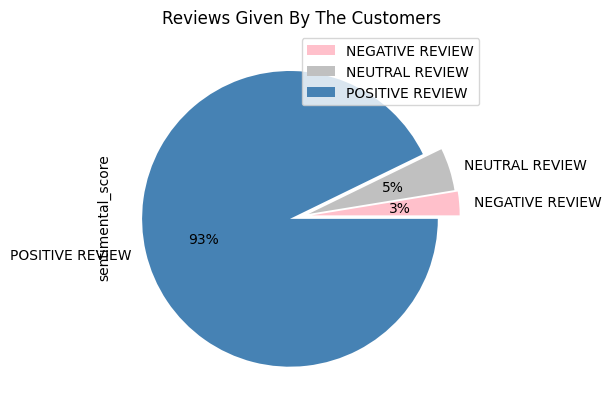

In [167]:
colors = ['pink', 'silver', 'steelblue']
explode = (0.07, 0.05, 0.08)
reviews_data.groupby(['sentimental_string_score']).sum().plot(kind='pie', y='sentimental_score', autopct='%1.0f%%',
                                colors = colors, explode=explode,
                                title='Reviews Given By The Customers')

#### Conclusion : Tha data is extracted form yelp website using beautifulsoup, the sentimental score of the extracted reviews are done using pretrained bert model the majority i.e 93%  reviews given by the customers are positive and only 3% of the customers gave bad reviews and 5% of the custmoners are just satisfied with the food and restaurant